In [7]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential 
from tensorflow.keras import regularizers

In [1]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_dir = '/Users/varun/documents/deep_learning/learn_pytorch/gesture_detection/train'

In [2]:
train_datagen = ImageDataGenerator(rescale = 1./255,
                                    validation_split = 0.1)

In [5]:
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    class_mode = 'categorical', 
                                                    target_size = (64, 64),
                                                    subset = 'training')

validation_generator = train_datagen.flow_from_directory(train_dir,
                                                    class_mode = 'categorical', 
                                                    target_size = (64, 64),
                                                    subset = 'validation')

Found 78300 images belonging to 29 classes.
Found 8700 images belonging to 29 classes.


In [8]:
model = Sequential()
    
model.add(Conv2D(16, kernel_size = [3,3], padding = 'same', activation = 'relu', input_shape = (64,64,3)))
model.add(Conv2D(32, kernel_size = [3,3], padding = 'same', activation = 'relu'))
model.add(MaxPool2D(pool_size = [3,3]))
    
model.add(Conv2D(32, kernel_size = [3,3], padding = 'same', activation = 'relu'))
model.add(Conv2D(64, kernel_size = [3,3], padding = 'same', activation = 'relu'))
model.add(MaxPool2D(pool_size = [3,3]))
    
model.add(Conv2D(128, kernel_size = [3,3], padding = 'same', activation = 'relu'))
model.add(Conv2D(256, kernel_size = [3,3], padding = 'same', activation = 'relu'))
model.add(MaxPool2D(pool_size = [3,3]))
    
model.add(BatchNormalization())
    
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(512, activation = 'relu', kernel_regularizer = regularizers.l2(0.001)))
model.add(Dense(29, activation = 'softmax'))

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 64, 64, 16)        448       
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 64, 64, 32)        4640      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 21, 21, 32)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 21, 21, 32)        9248      
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 21, 21, 64)        18496     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 7, 7, 64)          0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 7, 7, 128)        

In [10]:
from tensorflow.keras.optimizers import Adam


model.compile(optimizer = Adam(lr=0.001), loss = 'categorical_crossentropy', metrics = ["accuracy"])

In [11]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 10,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
Epoch 1/10
1223/1223 [==============================] - 336s 274ms/step - loss: 1.0839 - accuracy: 0.7698 - val_loss: 0.7771 - val_accuracy: 0.8164
Epoch 2/10
1223/1223 [==============================] - 307s 251ms/step - loss: 0.3528 - accuracy: 0.9530 - val_loss: 0.5094 - val_accuracy: 0.8870
Epoch 3/10
1223/1223 [==============================] - 320s 261ms/step - loss: 0.2850 - accuracy: 0.9674 - val_loss: 0.4614 - val_accuracy: 0.8933
Epoch 4/10
1223/1223 [==============================] - 305s 250ms/step - loss: 0.2393 - accuracy: 0.9745 - val_loss: 0.5427 - val_accuracy: 0.8810
Epoch 5/10
1223/1223 [==============================] - 306s 250ms/step - loss: 0.2363 - accuracy: 0.9780 - val_loss: 0.2784 - val_accuracy: 0.9509
Epoch 6/10
1223/1223 [==============================] - 305s 250ms/step - loss: 0.2217 - accuracy: 0.9789 - val_loss: 0.3626 - val_accuracy: 0.9451
Epoch 7/10
1223/1

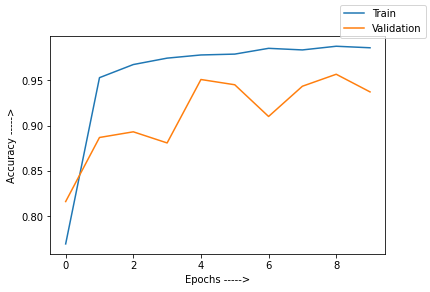

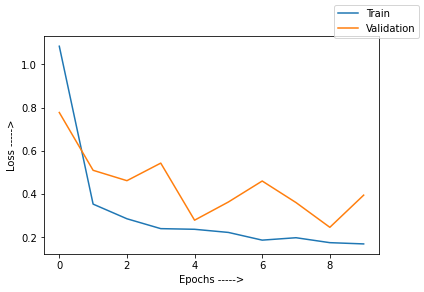

In [12]:
from matplotlib import pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']


ax1 = plt.figure(0)
plt.plot(acc,label = 'Train')
plt.plot(val_acc, label = 'Validation')
plt.xlabel('Epochs ----->')
plt.ylabel('Accuracy ----->')
leg = ax1.legend()


ax2 = plt.figure(1)
plt.plot(loss,label = 'Train')
plt.plot(val_loss,label = 'Validation')
plt.xlabel('Epochs ----->')
plt.ylabel('Loss ----->')
leg = ax2.legend()

In [13]:
print(validation_generator.class_indices)

{'A': 0, 'B': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8, 'J': 9, 'K': 10, 'L': 11, 'M': 12, 'N': 13, 'O': 14, 'P': 15, 'Q': 16, 'R': 17, 'S': 18, 'T': 19, 'U': 20, 'V': 21, 'W': 22, 'X': 23, 'Y': 24, 'Z': 25, 'del': 26, 'nothing': 27, 'space': 28}


In [14]:
class_labels = ['A','B','C','D','E','F','G','H','I','J','K','L',
               'M','N','O','P','Q','R','S','T','U','V','W','X',
               'Y','Z','del','nothing','space']

In [19]:
i = cv2.imread("test/A_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'A'

In [21]:
i = cv2.imread("test/B_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'B'

In [22]:
i = cv2.imread("test/C_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'C'

In [23]:
i = cv2.imread("test/D_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'D'

In [24]:
i = cv2.imread("test/E_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'E'

In [25]:
i = cv2.imread("test/F_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'F'

In [26]:
i = cv2.imread("test/G_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'G'

In [27]:
i = cv2.imread("test/H_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'H'

In [28]:
i = cv2.imread("test/I_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'D'

In [29]:
i = cv2.imread("test/J_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'J'

In [30]:
i = cv2.imread("test/K_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'K'

In [31]:
i = cv2.imread("test/L_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'L'

In [32]:
i = cv2.imread("test/M_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'M'

In [33]:
i = cv2.imread("test/N_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'N'

In [34]:
i = cv2.imread("test/O_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'O'

In [35]:
i = cv2.imread("test/P_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'P'

In [36]:
i = cv2.imread("test/Q_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'Q'

In [37]:
i = cv2.imread("test/R_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'R'

In [38]:
i = cv2.imread("test/S_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'A'

In [39]:
i = cv2.imread("test/T_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'nothing'

In [40]:
i = cv2.imread("test/U_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'B'

In [41]:
i = cv2.imread("test/V_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'K'

In [42]:
i = cv2.imread("test/W_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'F'

In [43]:
i = cv2.imread("test/X_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'nothing'

In [44]:
i = cv2.imread("test/Y_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'J'

In [45]:
i = cv2.imread("test/Z_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'Z'

In [46]:
i = cv2.imread("test/nothing_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'nothing'

In [48]:
i = cv2.imread("test/space_test.jpg")
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
class_labels[model.predict(i).argmax()]

'nothing'

In [49]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 5,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
Epoch 1/5
1223/1223 [==============================] - 320s 262ms/step - loss: 0.1213 - accuracy: 0.9936 - val_loss: 0.2473 - val_accuracy: 0.9465
Epoch 2/5
1223/1223 [==============================] - 310s 253ms/step - loss: 0.1570 - accuracy: 0.9875 - val_loss: 0.2248 - val_accuracy: 0.9727
Epoch 3/5
1223/1223 [==============================] - 311s 254ms/step - loss: 0.1145 - accuracy: 0.9926 - val_loss: 0.3394 - val_accuracy: 0.9345
Epoch 4/5
1223/1223 [==============================] - 319s 260ms/step - loss: 0.1245 - accuracy: 0.9916 - val_loss: 0.2028 - val_accuracy: 0.9507
Epoch 5/5
1223/1223 [==============================] - 310s 253ms/step - loss: 0.1094 - accuracy: 0.9912 - val_loss: 0.5102 - val_accuracy: 0.9000


In [50]:
model.save('gesture_model.h5')

In [51]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 5,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
Epoch 1/5
1223/1223 [==============================] - 310s 253ms/step - loss: 0.0891 - accuracy: 0.9953 - val_loss: 0.2445 - val_accuracy: 0.9519
Epoch 2/5
1223/1223 [==============================] - 309s 253ms/step - loss: 0.1341 - accuracy: 0.9901 - val_loss: 0.2534 - val_accuracy: 0.9581
Epoch 3/5
1223/1223 [==============================] - 311s 254ms/step - loss: 0.0692 - accuracy: 0.9972 - val_loss: 0.1403 - val_accuracy: 0.9620
Epoch 4/5
1223/1223 [==============================] - 310s 254ms/step - loss: 0.1113 - accuracy: 0.9912 - val_loss: 0.2150 - val_accuracy: 0.9729
Epoch 5/5
1223/1223 [==============================] - 310s 254ms/step - loss: 0.0573 - accuracy: 0.9982 - val_loss: 0.1257 - val_accuracy: 0.9667


In [52]:
model.save('gesture_model.h5')

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 64, 64, 16)        448       
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 64, 64, 32)        4640      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 21, 21, 32)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 21, 21, 32)        9248      
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 21, 21, 64)        18496     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 7, 7, 64)          0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 7, 7, 128)        

In [54]:
i = cv2.imread("test/A_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/B_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/C_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/D_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/E_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/F_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/G_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/H_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/I_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/J_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/K_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/L_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/M_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/N_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/O_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/P_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Q_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/R_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/S_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/T_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/U_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/V_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/W_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/X_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Y_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Z_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/space_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/nothing_test.jpg")
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])


A
B
C
D
E
F
G
H
I
J
K
X
M
N
O
P
Q
R
T
T
nothing
V
W
nothing
Y
Z
space
nothing


In [55]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 5,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
Epoch 1/5
1223/1223 [==============================] - 342s 280ms/step - loss: 0.1217 - accuracy: 0.9896 - val_loss: 0.2685 - val_accuracy: 0.9516
Epoch 2/5
1223/1223 [==============================] - 363s 297ms/step - loss: 0.0790 - accuracy: 0.9963 - val_loss: 0.2135 - val_accuracy: 0.9475
Epoch 3/5
1223/1223 [==============================] - 341s 278ms/step - loss: 0.0656 - accuracy: 0.9953 - val_loss: 0.2653 - val_accuracy: 0.9514
Epoch 4/5
1223/1223 [==============================] - 333s 273ms/step - loss: 0.0860 - accuracy: 0.9951 - val_loss: 0.2055 - val_accuracy: 0.9553
Epoch 5/5
1223/1223 [==============================] - 322s 263ms/step - loss: 0.0656 - accuracy: 0.9958 - val_loss: 0.1807 - val_accuracy: 0.9602


A
B
C
D
E
F
G
H
I
J
K
L
M
N
O
P
Q
R
S
T
nothing
K
W
nothing
Y
Z
nothing
nothing


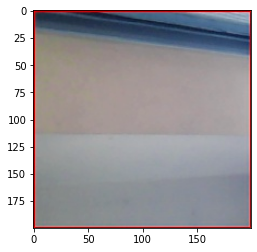

In [56]:
i = cv2.imread("test/A_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/B_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/C_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/D_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/E_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/F_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/G_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/H_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/I_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/J_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/K_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/L_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/M_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/N_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/O_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/P_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Q_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/R_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/S_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/T_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/U_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/V_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/W_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/X_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Y_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Z_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/space_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/nothing_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])

In [57]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 5,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
Epoch 1/5
1223/1223 [==============================] - 326s 266ms/step - loss: 0.0590 - accuracy: 0.9966 - val_loss: 0.2406 - val_accuracy: 0.9470
Epoch 2/5
1223/1223 [==============================] - 358s 292ms/step - loss: 0.0804 - accuracy: 0.9948 - val_loss: 0.1648 - val_accuracy: 0.9632
Epoch 3/5
1223/1223 [==============================] - 387s 316ms/step - loss: 0.0521 - accuracy: 0.9972 - val_loss: 0.2086 - val_accuracy: 0.9549
Epoch 4/5
1223/1223 [==============================] - 327s 267ms/step - loss: 0.0802 - accuracy: 0.9929 - val_loss: 0.1802 - val_accuracy: 0.9669
Epoch 5/5
1223/1223 [==============================] - 336s 275ms/step - loss: 0.0520 - accuracy: 0.9985 - val_loss: 0.1158 - val_accuracy: 0.9676


A
B
C
D
E
F
G
H
I
J
K
L
M
N
O
P
Q
R
S
T
B


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:142: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:149: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:156: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the r

K
W
nothing


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:163: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:170: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:177: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the r

Y
del
del
nothing


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:184: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:191: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


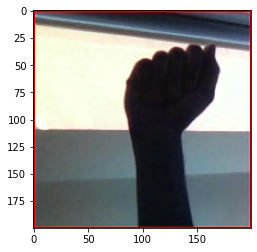

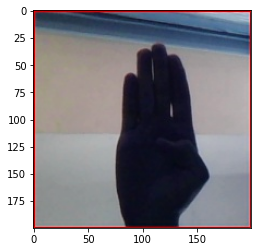

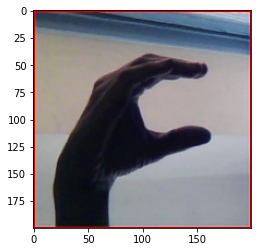

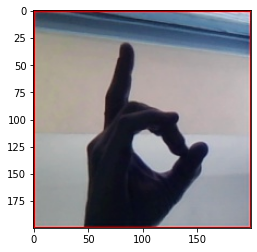

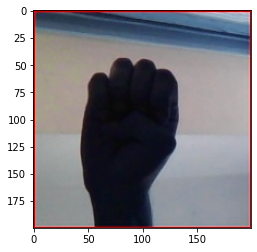

...

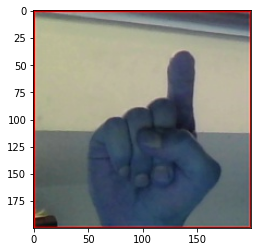

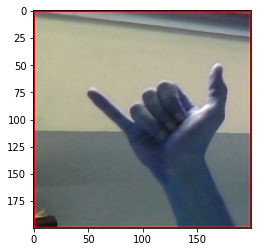

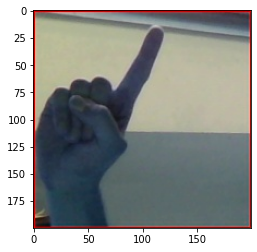

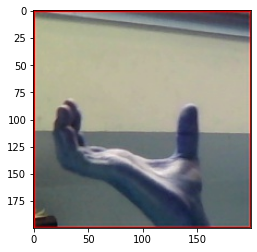

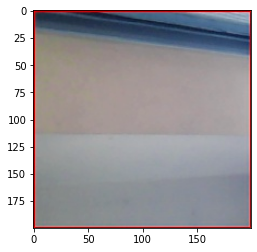

In [58]:
i = cv2.imread("test/A_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/B_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/C_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/D_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/E_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/F_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/G_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/H_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/I_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/J_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/K_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/L_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/M_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/N_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/O_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/P_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Q_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/R_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/S_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/T_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/U_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/V_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/W_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/X_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Y_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Z_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/space_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/nothing_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])

In [59]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 5,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
Epoch 1/5
1223/1223 [==============================] - 362s 296ms/step - loss: 0.0728 - accuracy: 0.9938 - val_loss: 0.1816 - val_accuracy: 0.9641
Epoch 2/5
1223/1223 [==============================] - 367s 300ms/step - loss: 0.0425 - accuracy: 0.9992 - val_loss: 0.0967 - val_accuracy: 0.9720
Epoch 3/5
1223/1223 [==============================] - 324s 265ms/step - loss: 0.0696 - accuracy: 0.9945 - val_loss: 0.2103 - val_accuracy: 0.9625
Epoch 4/5
1223/1223 [==============================] - 378s 309ms/step - loss: 0.0387 - accuracy: 0.9991 - val_loss: 0.0772 - val_accuracy: 0.9829
Epoch 5/5
1223/1223 [==============================] - 326s 267ms/step - loss: 0.0750 - accuracy: 0.9937 - val_loss: 0.1486 - val_accuracy: 0.9734


A
B
C
D
E
F
G
H
I
J
K
L
M
N
O
P
Q
R
S
T
M


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:142: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:149: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:156: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the r

K
W
nothing
Y

/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:170: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:177: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:184: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the r


Z
space


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:191: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


nothing


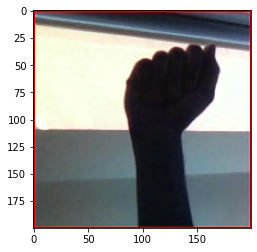

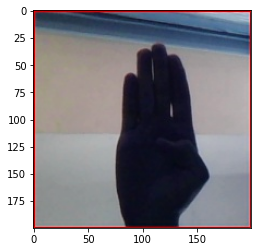

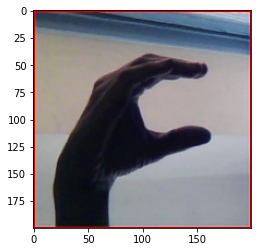

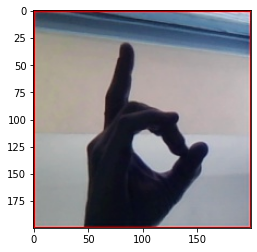

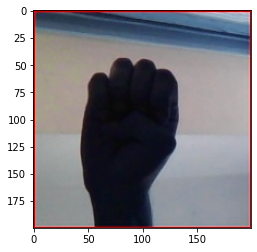

...

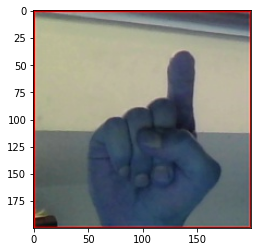

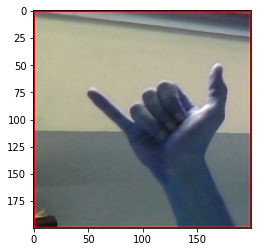

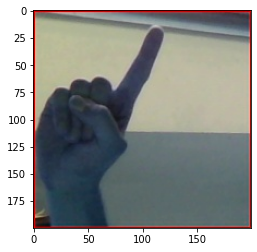

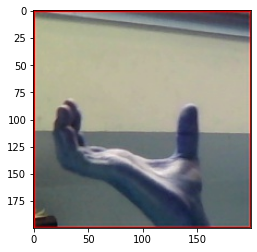

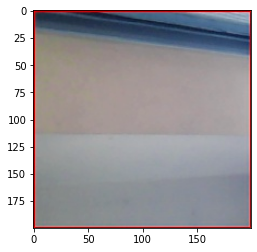

In [60]:
i = cv2.imread("test/A_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/B_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/C_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/D_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/E_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/F_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/G_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/H_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/I_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/J_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/K_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/L_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/M_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/N_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/O_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/P_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Q_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/R_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/S_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/T_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/U_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/V_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/W_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/X_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Y_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Z_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/space_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/nothing_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])

In [61]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 2,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
Epoch 1/2
1223/1223 [==============================] - 332s 271ms/step - loss: 0.0498 - accuracy: 0.9978 - val_loss: 0.2080 - val_accuracy: 0.9553
Epoch 2/2
1223/1223 [==============================] - 374s 306ms/step - loss: 0.0537 - accuracy: 0.9969 - val_loss: 0.1756 - val_accuracy: 0.9634


In [62]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 1,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
1223/1223 [==============================] - 336s 275ms/step - loss: 0.0320 - accuracy: 0.9989 - val_loss: 0.0890 - val_accuracy: 0.9815


A
B
C
D
E
F
G
H
I
J
K
L
M
N
O
P
Q
R
S
T


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:142: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:149: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:156: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the r

nothing
V
W
nothing
Y
Z
space
nothing


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:177: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:184: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:191: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the r

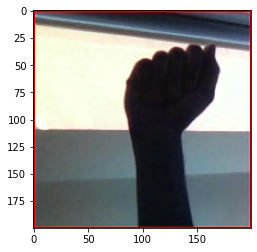

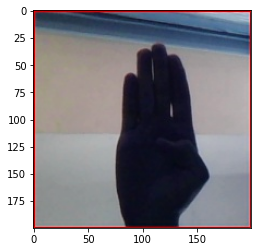

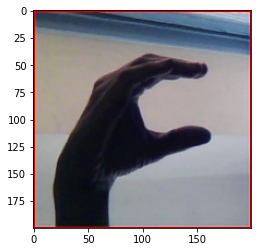

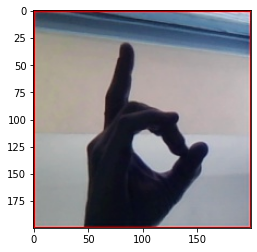

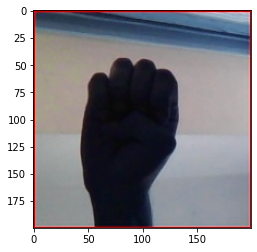

...

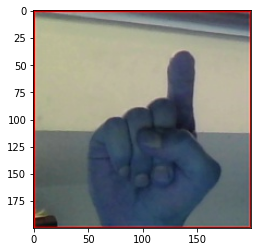

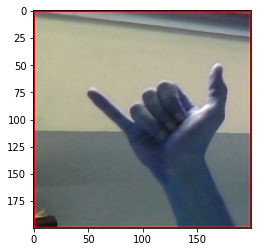

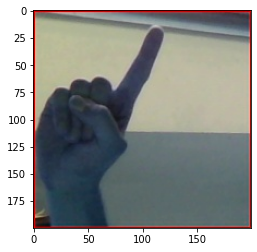

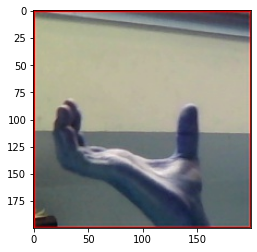

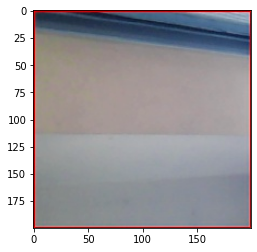

In [63]:
i = cv2.imread("test/A_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/B_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/C_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/D_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/E_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/F_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/G_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/H_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/I_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/J_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/K_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/L_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/M_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/N_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/O_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/P_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Q_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/R_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/S_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/T_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/U_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/V_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/W_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/X_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Y_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Z_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/space_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/nothing_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])

In [64]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 1,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
1223/1223 [==============================] - 336s 274ms/step - loss: 0.0630 - accuracy: 0.9953 - val_loss: 0.1338 - val_accuracy: 0.9704


In [65]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 1,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
1223/1223 [==============================] - 332s 272ms/step - loss: 0.0400 - accuracy: 0.9978 - val_loss: 0.1654 - val_accuracy: 0.9625


In [66]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 1,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
1223/1223 [==============================] - 336s 275ms/step - loss: 0.0577 - accuracy: 0.9960 - val_loss: 0.1965 - val_accuracy: 0.9560


In [67]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 1,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
1223/1223 [==============================] - 361s 296ms/step - loss: 0.0438 - accuracy: 0.9977 - val_loss: 0.1652 - val_accuracy: 0.9625


In [68]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 1,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
1223/1223 [==============================] - 369s 302ms/step - loss: 0.0451 - accuracy: 0.9965 - val_loss: 0.2461 - val_accuracy: 0.9574


In [69]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 1,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
1223/1223 [==============================] - 334s 273ms/step - loss: 0.0512 - accuracy: 0.9975 - val_loss: 0.1647 - val_accuracy: 0.9613


In [70]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 1,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
1223/1223 [==============================] - 331s 271ms/step - loss: 0.0367 - accuracy: 0.9981 - val_loss: 0.0931 - val_accuracy: 0.9819


A
B
C
D
E
F
G
H
I
J
K
L
M
S
O
P
Q
R
S
T


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:142: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:149: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:156: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the r

B
K
W
nothing
Y
Z


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:170: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:177: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:184: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the r

space
nothing


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:191: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


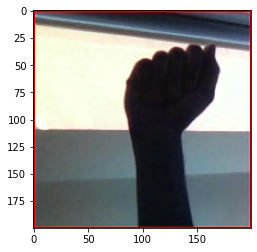

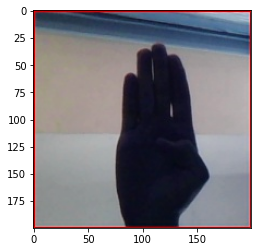

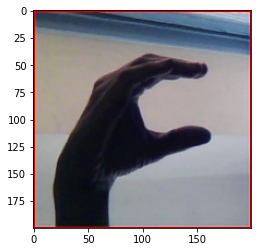

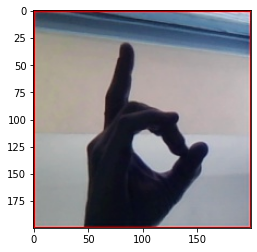

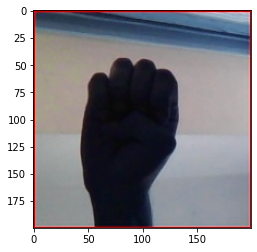

...

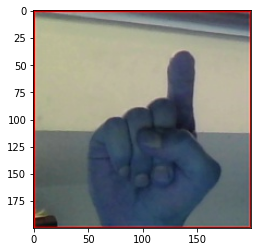

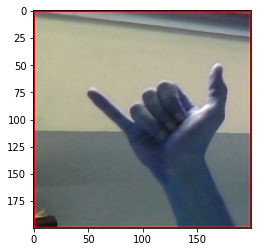

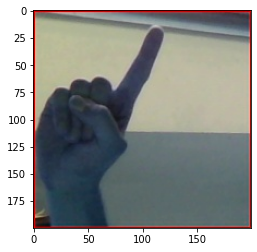

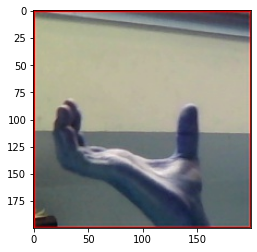

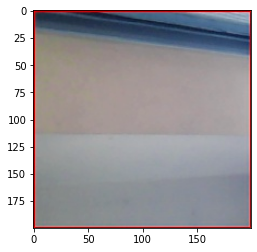

In [71]:
i = cv2.imread("test/A_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/B_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/C_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/D_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/E_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/F_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/G_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/H_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/I_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/J_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/K_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/L_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/M_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/N_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/O_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/P_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Q_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/R_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/S_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/T_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/U_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/V_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/W_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/X_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Y_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Z_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/space_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/nothing_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])

In [72]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 1,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
1223/1223 [==============================] - 333s 272ms/step - loss: 0.0239 - accuracy: 0.9992 - val_loss: 0.0612 - val_accuracy: 0.9817


A
B
C
D
E
F
G
H
I
J
K
L
M
N
O
P
Q
R
S
T
nothing
K
W
nothing


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:142: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:149: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:156: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the r

Y
Z


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:177: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:184: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


space
nothing


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:191: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


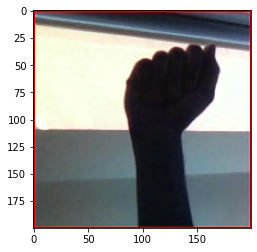

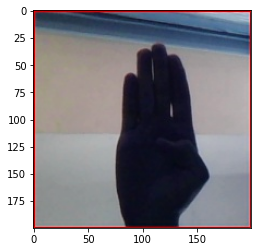

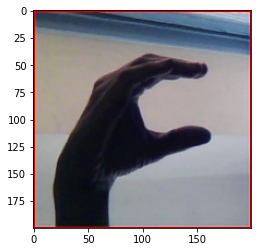

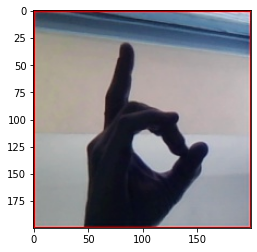

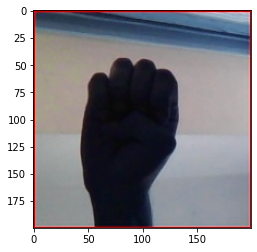

...

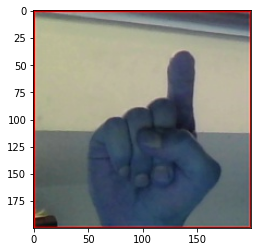

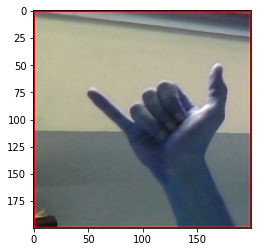

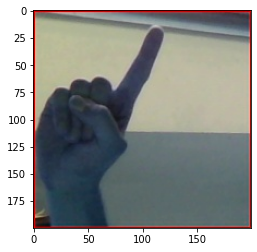

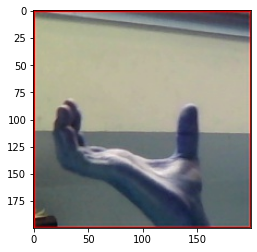

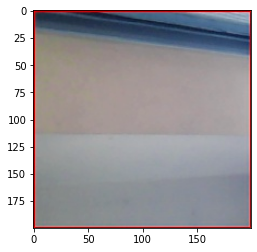

In [73]:
i = cv2.imread("test/A_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/B_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/C_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/D_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/E_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/F_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/G_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/H_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/I_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/J_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/K_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/L_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/M_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/N_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/O_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/P_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Q_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/R_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/S_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/T_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/U_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/V_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/W_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/X_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Y_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Z_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/space_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/nothing_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])

In [74]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 4,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
Epoch 1/4
1223/1223 [==============================] - 335s 274ms/step - loss: 0.0423 - accuracy: 0.9954 - val_loss: 0.2156 - val_accuracy: 0.9632
Epoch 2/4
1223/1223 [==============================] - 332s 271ms/step - loss: 0.0674 - accuracy: 0.9969 - val_loss: 0.1600 - val_accuracy: 0.9613
Epoch 3/4
1223/1223 [==============================] - 331s 271ms/step - loss: 0.0414 - accuracy: 0.9979 - val_loss: 0.1690 - val_accuracy: 0.9660
Epoch 4/4
1223/1223 [==============================] - 331s 271ms/step - loss: 0.0362 - accuracy: 0.9982 - val_loss: 0.3371 - val_accuracy: 0.9431


In [75]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 3,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
Epoch 1/3
1223/1223 [==============================] - 337s 276ms/step - loss: 0.0449 - accuracy: 0.9967 - val_loss: 0.1151 - val_accuracy: 0.9782
Epoch 2/3
1223/1223 [==============================] - 337s 275ms/step - loss: 0.0411 - accuracy: 0.9975 - val_loss: 0.1582 - val_accuracy: 0.9685
Epoch 3/3
1223/1223 [==============================] - 334s 273ms/step - loss: 0.0428 - accuracy: 0.9977 - val_loss: 0.1139 - val_accuracy: 0.9727


In [76]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 1,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
1223/1223 [==============================] - 335s 274ms/step - loss: 0.0412 - accuracy: 0.9980 - val_loss: 0.1372 - val_accuracy: 0.9664


In [77]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 1,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
1223/1223 [==============================] - 339s 277ms/step - loss: 0.0439 - accuracy: 0.9973 - val_loss: 0.1571 - val_accuracy: 0.9711


In [78]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 2,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
Epoch 1/2
1223/1223 [==============================] - 363s 297ms/step - loss: 0.0328 - accuracy: 0.9985 - val_loss: 0.1465 - val_accuracy: 0.9678
Epoch 2/2
1223/1223 [==============================] - 365s 298ms/step - loss: 0.0492 - accuracy: 0.9966 - val_loss: 0.1264 - val_accuracy: 0.9757


A
B
C
D
E
F
G
H
I
J
K
L
M
N
O
P
Q
R
S
T
B


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:142: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:149: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:156: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the r

K
W
nothing
Y


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:163: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:170: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:177: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the r

Z
R
nothing


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:191: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


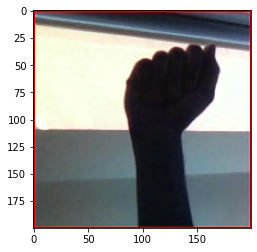

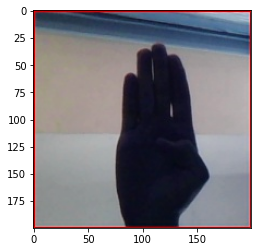

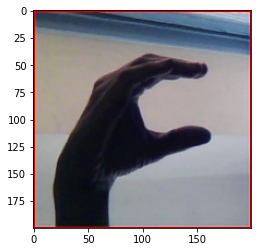

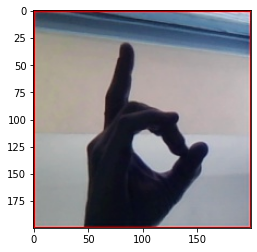

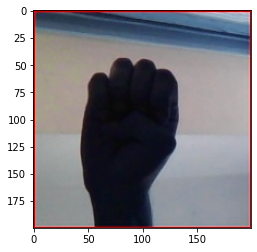

...

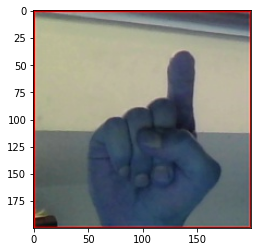

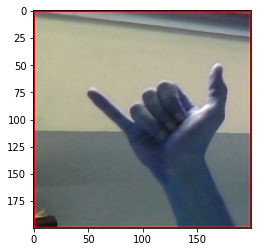

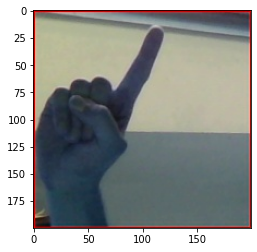

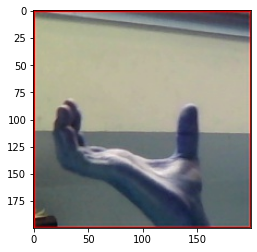

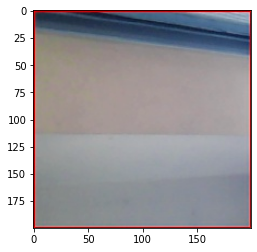

In [79]:
i = cv2.imread("test/A_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/B_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/C_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/D_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/E_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/F_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/G_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/H_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/I_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/J_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/K_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/L_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/M_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/N_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/O_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/P_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Q_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/R_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/S_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/T_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/U_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/V_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/W_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/X_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Y_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Z_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/space_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/nothing_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])

In [80]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 2,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
Epoch 1/2
1223/1223 [==============================] - 385s 315ms/step - loss: 0.0270 - accuracy: 0.9992 - val_loss: 0.0866 - val_accuracy: 0.9769
Epoch 2/2
1223/1223 [==============================] - 414s 338ms/step - loss: 0.0406 - accuracy: 0.9972 - val_loss: 0.1381 - val_accuracy: 0.9676


In [81]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples//64,
            epochs = 1,
            validation_steps = validation_generator.samples//64,
            verbose = 1)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 1223 steps, validate for 135 steps
1223/1223 [==============================] - 355s 290ms/step - loss: 0.0404 - accuracy: 0.9979 - val_loss: 0.1461 - val_accuracy: 0.9741


A
B
C
D
E
F
G
H
I
J
K
L
M
N
O
P
Q
R
S
M


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:142: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:149: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:156: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the r

R
V
W
nothing


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:163: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:170: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:177: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the r

Y
Z
del


/Users/varun/work_dl/lib/python3.6/site-packages/ipykernel_launcher.py:191: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


nothing


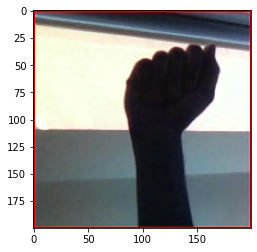

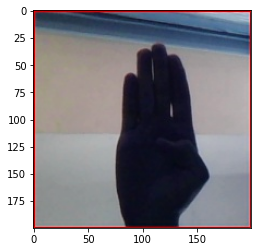

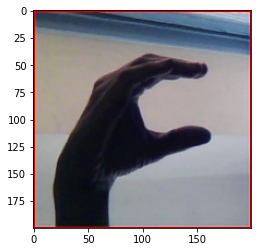

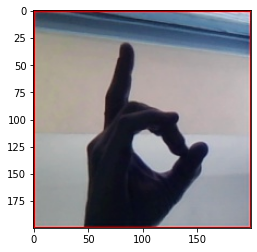

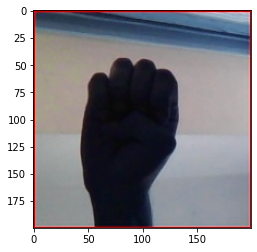

...

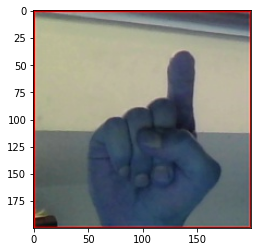

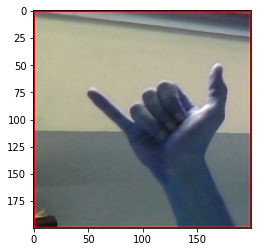

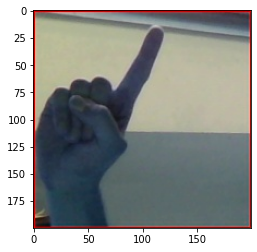

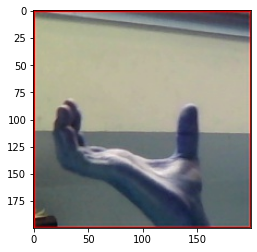

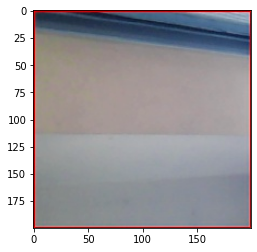

In [82]:
i = cv2.imread("test/A_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/B_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/C_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/D_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/E_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/F_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/G_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/H_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/I_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/J_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/K_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/L_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/M_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/N_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/O_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/P_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Q_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/R_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/S_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/T_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/U_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/V_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/W_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/X_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Y_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/Z_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/space_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])
i = cv2.imread("test/nothing_test.jpg")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])

In [83]:
model.save('gesture_model.h5')

X


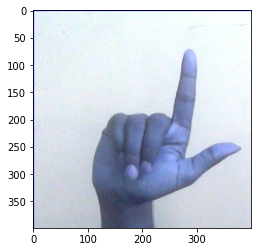

In [84]:
i = cv2.imread("test/L1.png")
plt.figure()
plt.imshow(i)
i = i/255
i = cv2.resize(i,(64,64))
i = np.expand_dims(i,axis = 0)
print(class_labels[model.predict(i).argmax()])